In [1]:
import numpy as np
import pandas as pd
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [ ]:
data = pd.read_csv('TrainingSet_37.csv')
test = pd.read_csv('TestSet_37.csv')
data.head(15)

In [8]:
import json

def scene_label_generator(label_path):
    with open(label_path, 'r') as f:
        label_data = json.load(f)
    scene_list = label_data.get('attributes', {}).get('scene', [])
    scene_str = ', '.join(scene_list)
    return scene_str

def traffic_label_generator(label_path):
    with open(label_path, 'r') as f:
        label_data = json.load(f)
    scene_list = label_data.get('attributes', {}).get('traffic', [])    
    scene_str = ', '.join(scene_list)
    return scene_str

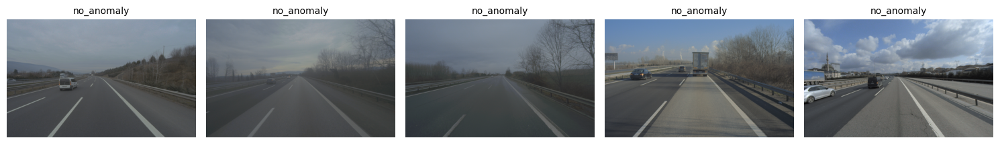

In [9]:
import matplotlib.pyplot as plt
import random
from PIL import Image

image_paths = data['file_path']
label_paths = data['custom_label_path']

indices = random.sample(range(len(image_paths)), 5)

fig, ax = plt.subplots(1, 5, figsize=(15, 8))

for i, idx in enumerate(indices):
    img_path = image_paths[idx]
    label_path = label_paths[idx]
    img = Image.open(img_path)

    scene_str = scene_label_generator(label_path)

    ax[i].imshow(img)
    ax[i].set_title(scene_str, fontsize=10)
    ax[i].axis('off')

fig.tight_layout()
fig.show()


In [10]:
def label_engineering(data):
    data['scene_label'] = data.apply(lambda x: scene_label_generator(x['custom_label_path']), axis=1)
    data['traffic_label'] = data.apply(lambda x: traffic_label_generator(x['custom_label_path']), axis=1)
    return data

data = label_engineering(data)
test = label_engineering(test)

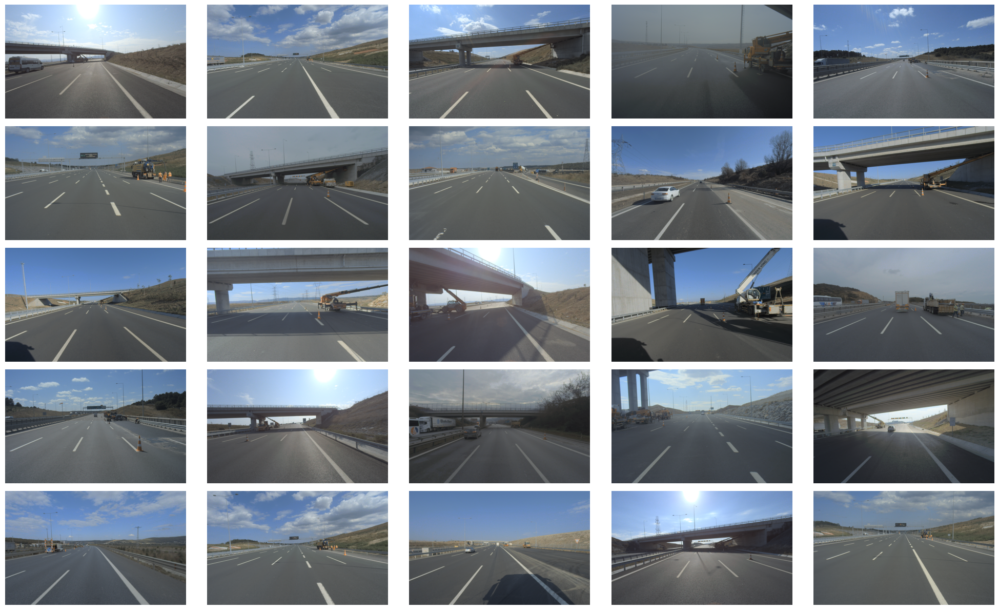

In [11]:
construction_image_paths = data.loc[data['scene_label'] == 'construction', 'file_path']
indices = random.sample(range(len(construction_image_paths)), 25)

fig, ax = plt.subplots(5, 5, figsize=(20, 12))

for i, idx in enumerate(indices):
    row = i // 5
    column = i % 5
    construction_img_path = construction_image_paths.iloc[idx]
    img = Image.open(construction_img_path)

    ax[row, column].imshow(img)
    ax[row, column].axis('off')

fig.tight_layout()
fig.show()


In [12]:
from PIL import ImageEnhance

def enhance_construction_image(img):
    enhanced_image = ImageEnhance.Contrast(img).enhance(1.5)
    enhanced_image = ImageEnhance.Brightness(img).enhance(0.85)

    r, g, b = enhanced_image.split()

    r_factor = random.uniform(1.4, 1.6)
    g_factor = random.uniform(1.2, 1.3)
    r = r.point(lambda i: min(255, int(i * r_factor)))  
    g = g.point(lambda i: min(255, int(i * g_factor)))  
    enhanced_image = Image.merge('RGB', (r, g, b))

    return enhanced_image

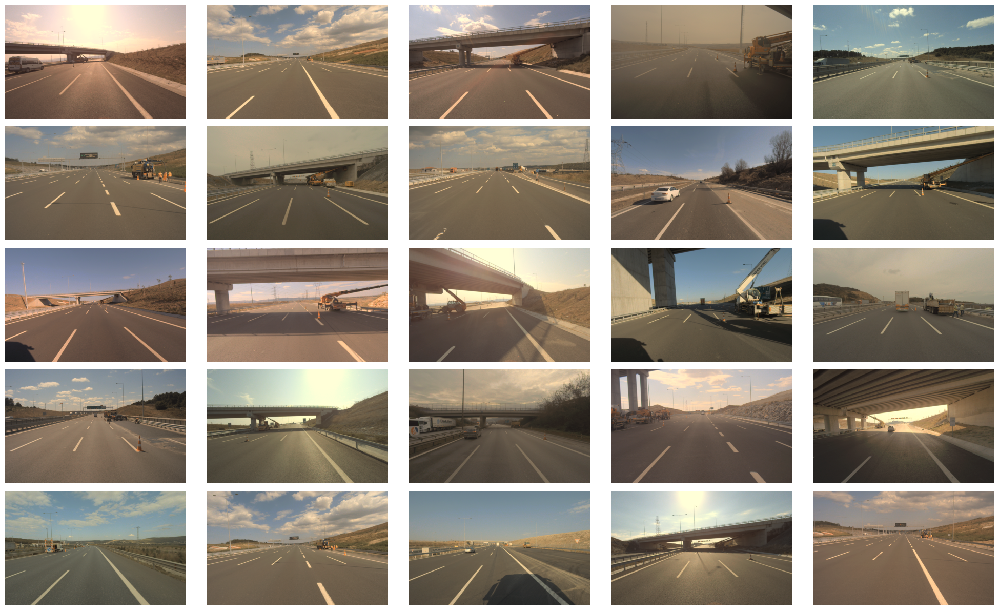

In [13]:
fig, ax = plt.subplots(5, 5, figsize=(20, 12))
for i, idx in enumerate(indices):
    row = i // 5
    column = i % 5
    construction_img_path = construction_image_paths.iloc[idx]
    img = enhance_construction_image(Image.open(construction_img_path))

    ax[row, column].imshow(img)
    ax[row, column].axis('off')

fig.tight_layout()
fig.show()

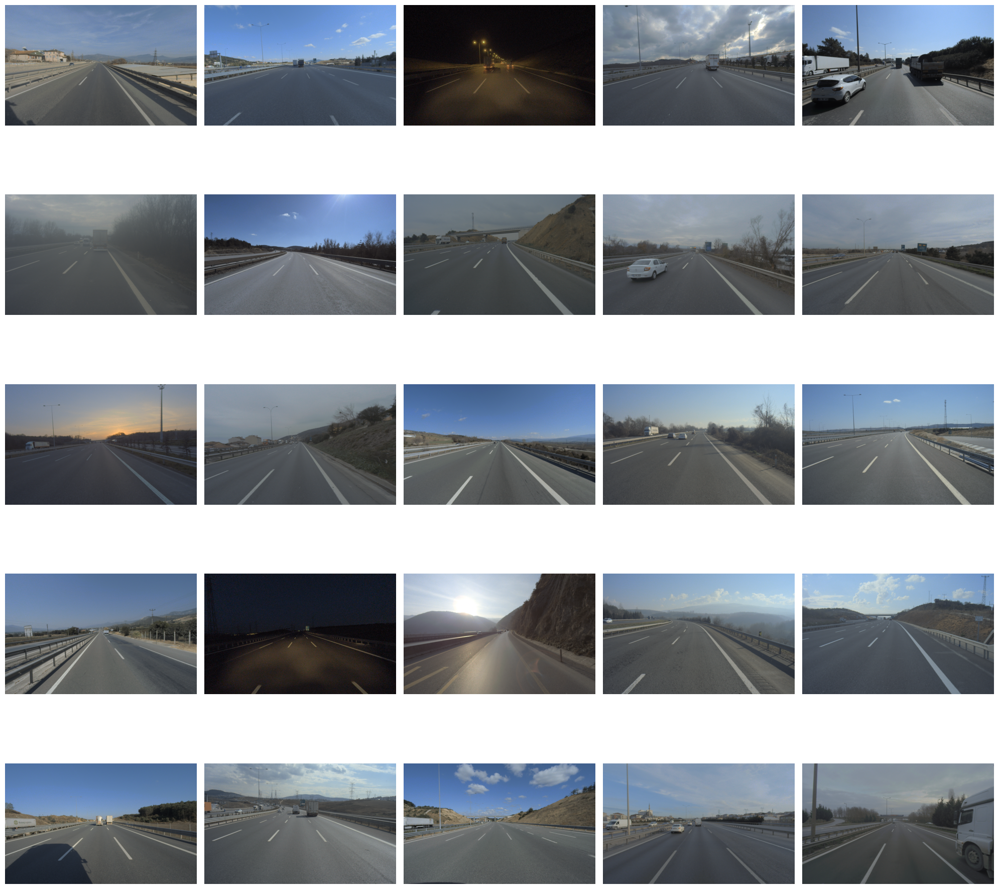

In [14]:
nanomaly_image_paths = data.loc[data['scene_label'] == 'no_anomaly', 'file_path']
indices = random.sample(range(len(nanomaly_image_paths)), 25)

fig, ax = plt.subplots(5, 5, figsize=(20, 20))

for i, idx in enumerate(indices):
    row = i // 5
    col = i % 5
    nanomaly_image_path = nanomaly_image_paths.iloc[idx]
    img = Image.open(nanomaly_image_path)

    ax[row, col].imshow(img)
    ax[row, col].axis('off')

fig.tight_layout()
plt.show()

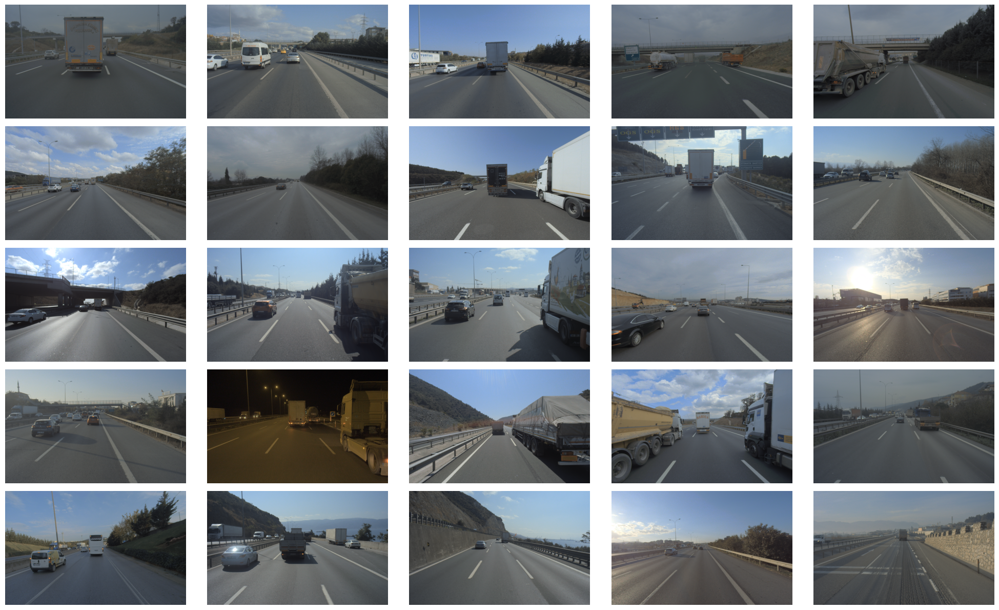

In [15]:
moderatet_image_paths = data.loc[data['traffic_label'] == 'moderate_traffic', 'file_path']
indices = random.sample(range(len(moderatet_image_paths)), 25)

fig, ax = plt.subplots(5, 5, figsize=(20, 12))

for i, idx in enumerate(indices):
    row = i // 5
    column = i % 5
    moderatet_image_path = moderatet_image_paths.iloc[idx]
    img = Image.open(moderatet_image_path)

    ax[row, column].imshow(img)
    ax[row, column].axis('off')

fig.tight_layout()
fig.show()

In [18]:
subset = data.sample(n=10000, random_state=42)
subset['scene_label'] = subset.apply(lambda x: scene_label_generator(x['custom_label_path']), axis=1)
subset['traffic_label'] = subset.apply(lambda x: traffic_label_generator(x['custom_label_path']), axis=1)

In [ ]:
from collections import Counter
label_list = subset['traffic_label']

label_counts = Counter(label_list)

classes = list(label_counts.keys())
counts = list(label_counts.values())


fig, ax = plt.subplots(1, 1, figsize=(30, 8))
ax.bar(classes, counts)
ax.set_title('Numbers of Images per Class')
ax.set_xlabel('Labels')
ax.set_xticks(range(len(classes)))                
ax.set_xticklabels(classes, rotation=0, ha='center') 
ax.set_ylabel('Counts per Class')
fig.show()

In [ ]:
print(subset['traffic_label'].unique())
print(subset['scene_label'].unique())

In [ ]:
print(data['scene_label'].value_counts())
print(data['traffic_label'].value_counts())

In [ ]:
from collections import Counter
label_list = subset['scene_label']

label_counts = Counter(label_list)

classes = list(label_counts.keys())
counts = list(label_counts.values())


fig, ax = plt.subplots(1, 1, figsize=(30, 8))
ax.bar(classes, counts)
ax.set_title('Numbers of Images per Class')
ax.set_xlabel('Labels')
ax.set_xticks(range(len(classes)))                
ax.set_xticklabels(classes, rotation=0, ha='center') 
ax.set_ylabel('Counts per Class')
fig.show()

## Data Resampling to reduce bias

In [ ]:
scene_classes = ['scene_classes_placeholder']  
traffic_classes = ['traffic_classes_placeholder']  


In [ ]:
print(data['scene_label'].isna().count())

In [27]:
# data = pd.read_csv('./datasets/prepped_data.csv')
# test = pd.read_csv('./datasets/prepped_test.csv')

In [ ]:
print(test['scene_label'].value_counts())

In [ ]:
print(data['scene_label'].value_counts())
print(data['traffic_label'].value_counts())

In [ ]:
print(test['scene_label'].unique())
print(test['traffic_label'].unique())

In [ ]:
print(data['scene_label'].unique())
print(data['traffic_label'].unique())

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
from torch.amp import GradScaler, autocast

IMAGE_SIZE = 224
EPOCHS = 15
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class MultiOutputDataset(Dataset):
    def __init__(self, cnn_data, scene_classes, traffic_classes, transform=None):
        self.cnn_data = cnn_data
        self.transform = transform or transforms.ToTensor()
        self.scene_classes = scene_classes
        self.traffic_classes = traffic_classes

        self.scene2idx = {label: idx for idx, label in enumerate(self.scene_classes)}
        self.traffic2idx = {label: idx for idx, label in enumerate(self.traffic_classes)}

    def __len__(self):
        return len(self.cnn_data)
    
    def __getitem__(self, index):
        row = self.cnn_data.iloc[index]
        image_path = row['file_path']
        try:
            image = Image.open(image_path).convert('RGB')
        except Exception as e:
            print('Bad image path', image_path)
            raise RuntimeError(f"Failed to open image: {image_path}") from e

        if self.transform:
            image = self.transform(image)

        try:
            scene_label = torch.tensor(self.scene2idx.get(row['scene_label']), dtype=torch.long)
            traffic_label = torch.tensor(self.traffic2idx.get(row['traffic_label']), dtype=torch.long)
        except KeyError as e:
            print(f"Label error at index {index} - {e}")
            print(row)
            raise

        return image, scene_label, traffic_label
    

transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)), transforms.ToTensor(), transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

dataset = MultiOutputDataset(cnn_data=data, scene_classes=scene_classes, traffic_classes=traffic_classes, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=16)

testset = MultiOutputDataset(cnn_data=test, scene_classes=scene_classes, traffic_classes=traffic_classes, transform=transform)
testloader = DataLoader(testset, batch_size=32, shuffle=False, num_workers=16)

In [ ]:
print("scene_classes:", scene_classes)
print("traffic_classes:", traffic_classes)
print("len(scene_classes):", len(scene_classes))
print("len(traffic_classes):", len(traffic_classes))

In [37]:
class MultiOutputResNet(nn.Module):
    def __init__(self, base_model, num_scene, num_traffic):
        super().__init__()
        self.backbone = nn.Sequential(*list(base_model.children())[:-1])
        in_features = base_model.fc.in_features
        self.scene_head = nn.Linear(in_features, num_scene)
        self.traffic_head = nn.Linear(in_features, num_traffic)

    def forward(self, x):
        x = self.backbone(x)
        x = torch.flatten(x, 1)
        return self.scene_head(x), self.traffic_head(x)

resnet_base = models.resnet50(weights='DEFAULT')
model = MultiOutputResNet(resnet_base, len(scene_classes), len(traffic_classes)).to(DEVICE)

In [38]:
from sklearn.utils.class_weight import compute_class_weight

scene_onehot = pd.get_dummies(data['scene_label'])
traffic_onehot = pd.get_dummies(data['traffic_label'])

scene_onehot = scene_onehot.reindex(columns=scene_classes, fill_value=0)
traffic_onehot = traffic_onehot.reindex(columns=traffic_classes, fill_value=0)

multi_hot_df = pd.concat([scene_onehot, traffic_onehot], axis=1)

train_labels = multi_hot_df.values 

num_classes = train_labels.shape[1]
pos_weights = []

for i in range(num_classes):
    class_labels = train_labels[:, i]  
    weights = compute_class_weight(class_weight='balanced', classes=np.array([0, 1]), y=class_labels)
    pos_weights.append(weights[1])

pos_weights_tensor = torch.tensor(pos_weights, dtype=torch.float32)
scene_pos_weights = pos_weights_tensor[:len(scene_classes)].to(DEVICE)
traffic_pos_weights = pos_weights_tensor[len(scene_classes):].to(DEVICE)

scene_alpha_tensor = scene_pos_weights / scene_pos_weights.sum()
traffic_alpha_tensor = traffic_pos_weights / traffic_pos_weights.sum()

In [41]:
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, gamma=2.0, alpha=None, reduction='mean'):
        super().__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.reduction = reduction
    
    def forward(self,  logits, targets):
        probs = torch.sigmoid(logits)
        targets = targets.float()


        BCE_loss = F.binary_cross_entropy_with_logits(input=logits, target=targets, reduction='none')

        pt = torch.where(targets == 1, probs, 1 - probs)  
        focal_weight = (1 - pt) ** self.gamma

        if self.alpha is not None:
            alpha = self.alpha.to(logits.device)
            alpha_weight = torch.where(targets == 1, alpha, 1 - alpha)
            focal_weight *= alpha_weight

        loss = focal_weight * BCE_loss

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        return loss

In [42]:
scene_focal_loss = FocalLoss(alpha=scene_alpha_tensor)
traffic_focal_loss = FocalLoss(alpha=traffic_alpha_tensor)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
scaler = GradScaler()

for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0

    for images, scene_labels, traffic_labels in dataloader:
        images = images.to(DEVICE)
        scene_labels = scene_labels.to(DEVICE)
        traffic_labels = traffic_labels.to(DEVICE)

        optimizer.zero_grad()

        with autocast(device_type='cuda'):
            out_scene, out_traffic = model(images)
            scene_labels = F.one_hot(scene_labels, num_classes=out_scene.shape[1]).float()
            traffic_labels = F.one_hot(traffic_labels, num_classes=out_traffic.shape[1]).float()
            loss_scene = scene_focal_loss(out_scene, scene_labels)
            loss_traffic = traffic_focal_loss(out_traffic, traffic_labels)
            loss = loss_scene + loss_traffic

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()

        print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {running_loss/len(dataloader):.4f}")

Epoch 1/15, Loss: 0.0001
Epoch 1/15, Loss: 0.0001
Epoch 1/15, Loss: 0.0002
Epoch 1/15, Loss: 0.0002
Epoch 1/15, Loss: 0.0003
Epoch 1/15, Loss: 0.0003
Epoch 1/15, Loss: 0.0003
Epoch 1/15, Loss: 0.0003
Epoch 1/15, Loss: 0.0004
Epoch 1/15, Loss: 0.0004
Epoch 1/15, Loss: 0.0004
Epoch 1/15, Loss: 0.0004
Epoch 1/15, Loss: 0.0004
Epoch 1/15, Loss: 0.0004
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005
Epoch 1/15, Loss: 0.0005


In [45]:
import torch.nn.functional as F
from sklearn.metrics import precision_score, recall_score, f1_score

model.eval()

scene_probs, scene_preds, scene_labels_a = [], [], []
traffic_probs, traffic_preds, traffic_labels_a = [], [], []

with torch.no_grad():
    for images, scene_labels, traffic_labels in testloader:
        images = images.to(DEVICE)
        scene_labels = scene_labels.to(DEVICE)
        traffic_labels = traffic_labels.to(DEVICE)
        scene_out, traffic_out = model(images)

        scene_p = F.softmax(scene_out, dim=1)
        print(scene_p)
        traffic_p = F.softmax(traffic_out, dim=1)
        print(traffic_p)

        scene_probs.append(scene_p.cpu())
        traffic_probs.append(traffic_p.cpu())

        scene_preds.append(scene_p.argmax(dim=1).cpu())
        traffic_preds.append(traffic_p.argmax(dim=1).cpu())

        scene_labels_a.append(scene_labels.cpu())
        traffic_labels_a.append(traffic_labels.cpu())

scene_probs = torch.cat(scene_probs).numpy()
scene_preds = torch.cat(scene_preds).numpy()
scene_labels_a = torch.cat(scene_labels_a).numpy()

traffic_probs = torch.cat(traffic_probs).numpy()
traffic_preds = torch.cat(traffic_preds).numpy()
traffic_labels_a = torch.cat(traffic_labels_a).numpy()


tensor([[9.8954e-01, 1.3149e-03, 1.4309e-03, 2.6658e-03, 5.0481e-03],
        [9.9996e-01, 1.1348e-05, 3.1484e-06, 9.5799e-06, 1.8731e-05],
        [9.9887e-01, 1.5195e-04, 1.6728e-04, 8.3619e-05, 7.2920e-04],
        [9.9805e-01, 6.2142e-04, 2.6752e-04, 4.0669e-04, 6.5772e-04],
        [9.9836e-01, 4.9670e-04, 4.8050e-04, 2.8037e-04, 3.8285e-04],
        [9.9821e-01, 1.2514e-04, 1.9639e-04, 3.9444e-05, 1.4267e-03],
        [9.8649e-01, 4.3622e-03, 9.5070e-04, 9.2641e-04, 7.2739e-03],
        [9.9468e-01, 1.4771e-03, 1.2990e-03, 8.3335e-04, 1.7057e-03],
        [9.9990e-01, 1.8724e-05, 1.3965e-05, 1.9111e-05, 5.1223e-05],
        [2.0718e-01, 1.3279e-02, 8.7477e-03, 1.9201e-02, 7.5159e-01],
        [9.9810e-01, 2.6369e-04, 2.1860e-04, 1.6289e-04, 1.2499e-03],
        [9.9932e-01, 1.0322e-04, 1.1448e-04, 3.9752e-05, 4.2655e-04],
        [9.9993e-01, 1.0796e-05, 1.4047e-05, 3.3979e-06, 3.9269e-05],
        [9.9969e-01, 3.9860e-05, 8.2598e-05, 4.0253e-05, 1.4855e-04],
        [9.9827e-01,

In [ ]:
from sklearn.metrics import classification_report

def evaluate_head(preds, labels, head_name, class_names=None):
    precision = precision_score(labels, preds, average='weighted')
    recall = recall_score(labels, preds, average='weighted')
    f1 = f1_score(labels, preds, average='weighted')
    classification_report_1=classification_report(labels, preds, target_names=class_names)
    
    print(f"\n[{head_name}]")
    print(f"Precision: {precision}")
    print(f"Recall:    {recall}")
    print(f"F1 Score:  {f1}")
    print(f"Classification Report: {classification_report_1}")

evaluate_head(scene_preds, scene_labels_a, "Scene", scene_classes)
evaluate_head(traffic_preds, traffic_labels_a, "Traffic", traffic_classes)